<a href="https://colab.research.google.com/github/chidera20/Chidera_VisionAI_Project/blob/main/Chidera_VisionAI_Project_YOLOv8_Test2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Change runtime to access GPU

In [1]:
!nvidia-smi

Sun Dec  8 21:36:40 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  NVIDIA A100-SXM4-40GB          Off | 00000000:00:04.0 Off |                    0 |
| N/A   33C    P0              46W / 400W |      2MiB / 40960MiB |      0%      Default |
|                                         |                      |             Disabled |
+-----------------------------------------+----------------------+--

In [2]:
import os
HOME = os.getcwd()
print(HOME)

/content


Install YOLOv8

In [3]:
# Pip install method (recommended)

!pip install ultralytics==8.2.103 -q

from IPython import display
display.clear_output()

import ultralytics
ultralytics.checks()

Ultralytics YOLOv8.2.103 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
Setup complete ✅ (12 CPUs, 83.5 GB RAM, 32.6/112.6 GB disk)


In [4]:
from ultralytics import YOLO

from IPython.display import display, Image

Download Annotated Dataset

In [5]:
%cd {HOME}
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="yKlKJ7yYlXvdcxBfY6jt")
project = rf.workspace("chidera-igwebuike").project("cartoons_by_name")
version = project.version(1)
dataset = version.download("yolov8")


/content
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 80.9/80.9 kB 8.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 6.6 MB/s eta 0:00:00
  Attempting uninstall: idna
    Found existing installation: idna 3.10
    Uninstalling idna-3.10:
      Successfully uninstalled idna-3.10
loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to Cartoons_By_Name-1 in yolov8:: 100%|██████████| 2396/2396 [00:00<00:00, 6727.46it/s]


Train Custom YOLOv8

In [6]:
%cd {HOME}

!yolo task=detect mode=train model=yolov8s.pt data={dataset.location}/data.yaml epochs=100 imgsz=800 plots=True

/content
100% 21.5M/21.5M [00:00<00:00, 535MB/s]
New https://pypi.org/project/ultralytics/8.3.48 available 😃 Update with 'pip install -U ultralytics'
Ultralytics YOLOv8.2.103 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
engine/trainer: task=detect, mode=train, model=yolov8s.pt, data=/content/Cartoons_By_Name-1/data.yaml, epochs=100, time=None, patience=100, batch=16, imgsz=800, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_n

In [7]:
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

/content


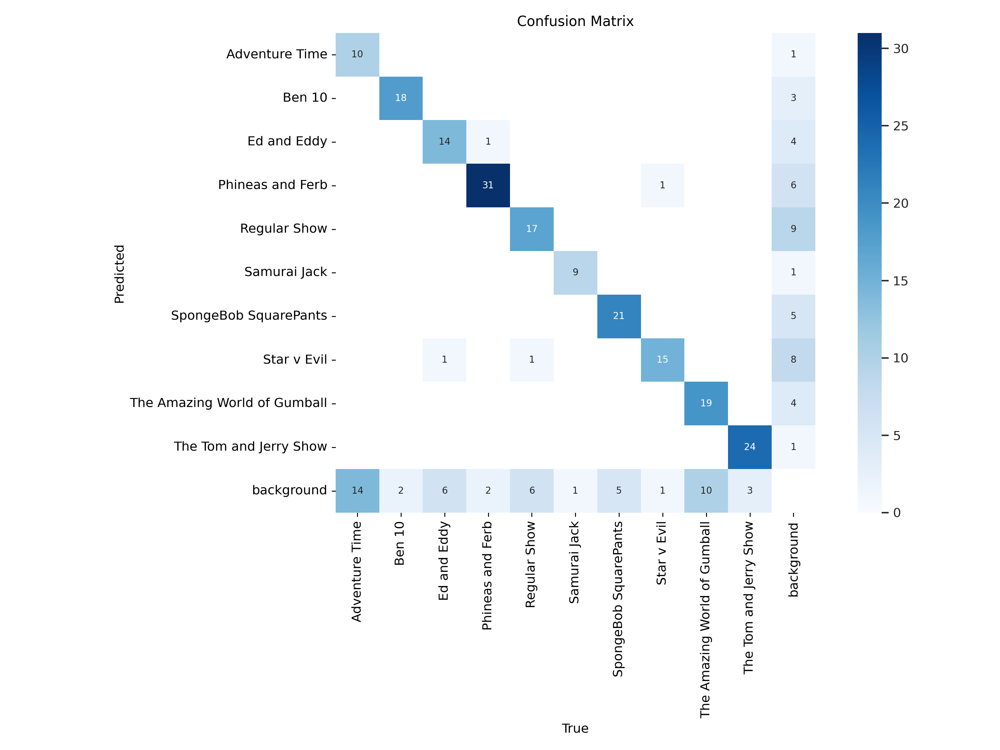

In [8]:
%cd {HOME}
Image(filename=f'{HOME}/runs/detect/train/confusion_matrix.png', width=600)

Evaluate Custom YOLOv5

/content


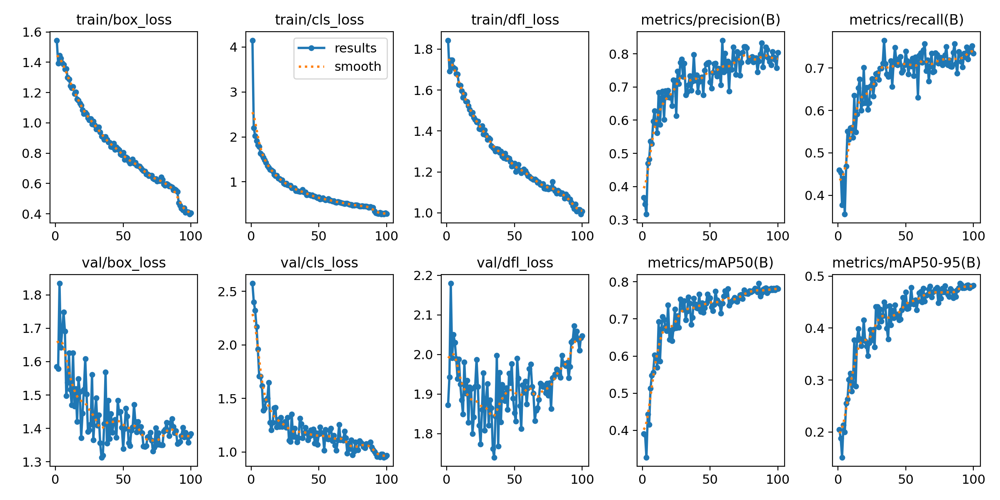

In [9]:
%cd {HOME}
Image(filename=f'{HOME}/runs/detect/train/results.png', width=600)

Visualize Training Data

/content


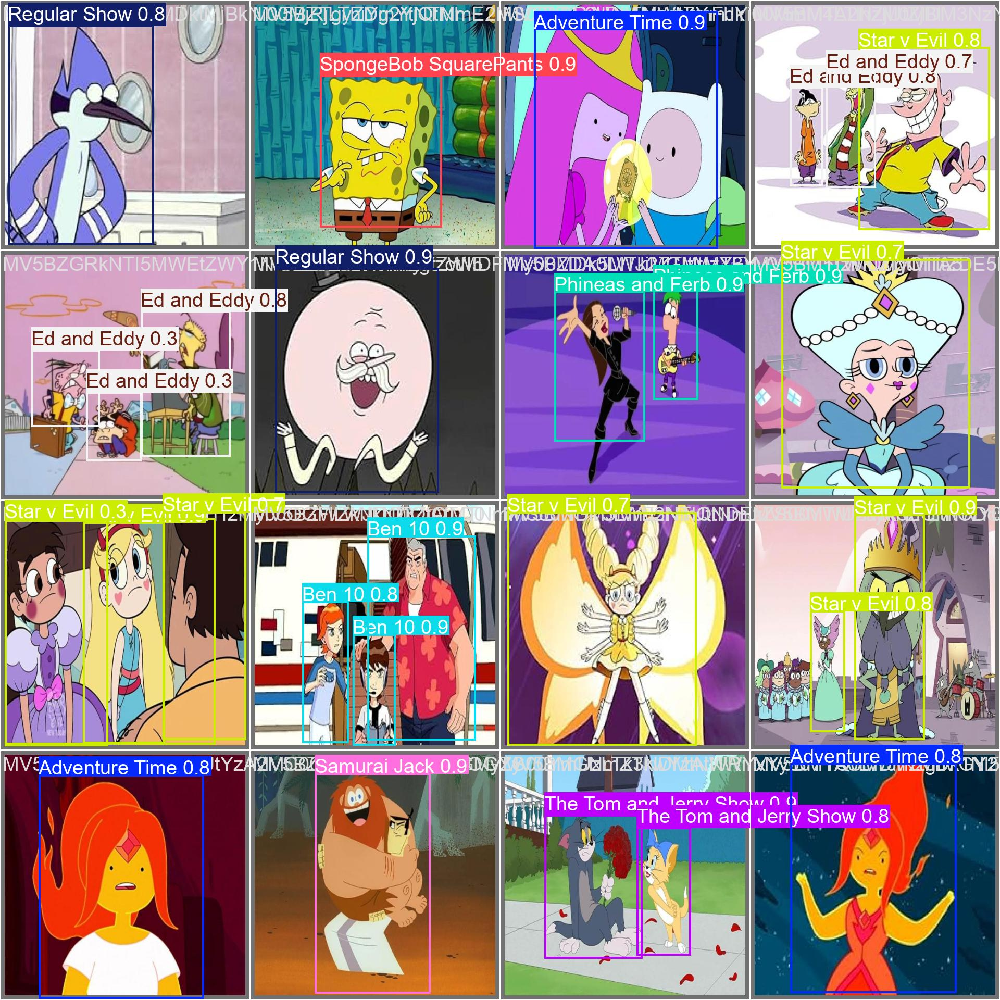

In [10]:
%cd {HOME}
Image(filename=f'{HOME}/runs/detect/train/val_batch0_pred.jpg', width=600)

## Validate Custom Model

In [11]:
%cd {HOME}

!yolo task=detect mode=val model={HOME}/runs/detect/train/weights/best.pt data={dataset.location}/data.yaml

/content
Ultralytics YOLOv8.2.103 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
Model summary (fused): 168 layers, 11,129,454 parameters, 0 gradients, 28.5 GFLOPs
val: Scanning /content/Cartoons_By_Name-1/valid/labels.cache... 100 images, 0 backgrounds, 0 corrupt: 100% 100/100 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% 7/7 [00:02<00:00,  2.64it/s]
                   all        100        232      0.797      0.737      0.784      0.485
        Adventure Time         10         24      0.794      0.417      0.469      0.304
                Ben 10         10         20      0.868        0.9      0.926      0.587
           Ed and Eddy         10         21      0.668      0.576      0.629      0.274
      Phineas and Ferb         10         34      0.861      0.912      0.949      0.647
          Regular Show         10         24      0.612      0.583      0.637      0.319
          Samurai

## Inference with Custom Model

In [12]:
%cd {HOME}
!yolo task=detect mode=predict model={HOME}/runs/detect/train/weights/best.pt conf=0.25 source={dataset.location}/test/images save=True

/content
Ultralytics YOLOv8.2.103 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
Model summary (fused): 168 layers, 11,129,454 parameters, 0 gradients, 28.5 GFLOPs

image 1/50 /content/Cartoons_By_Name-1/test/images/MV5BM2E0NWIwMDItODNjNi00Y2QzLThkOTItMjBkYzU5YTZhN2JkXkEyXkFqcGc-_V1_QL75_UX820__jpg.rf.35ce0edb599ccabfbba169bcd6860ef7.jpg: 800x800 1 Ed and Eddy, 7.7ms
image 2/50 /content/Cartoons_By_Name-1/test/images/MV5BMDI0YWVjMTQtZGY4Yi00NGNlLTg5ZTgtNmU1NmIyNjE3YjAxXkEyXkFqcGc-_V1_QL75_UX820__jpg.rf.fdb965018fbc1e48ec0d9f643e0cda91.jpg: 800x800 2 Star v Evils, 7.8ms
image 3/50 /content/Cartoons_By_Name-1/test/images/MV5BMDNjYjhjZDMtMGQ0NS00OTU2LWFlMWQtZjkwYzY3MTBmNzc4XkEyXkFqcGc-_V1_QL75_UX820__jpg.rf.9a89a59419539e039663053299dc9dc2.jpg: 800x800 3 The Amazing World of Gumballs, 7.7ms
image 4/50 /content/Cartoons_By_Name-1/test/images/MV5BMDk0MmQ4OTUtM2ZjYi00YTFlLTkwYTktOGQ2YjY1ZjExNTM3XkEyXkFqcGc-_V1_QL75_UX820__jpg.rf.6f0f9d1dcf873746db4cee5ff7b7a620.j

Visualize results.

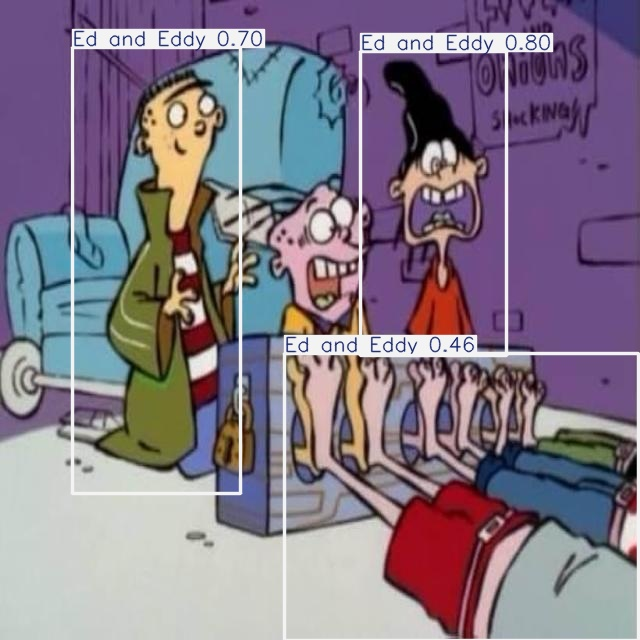

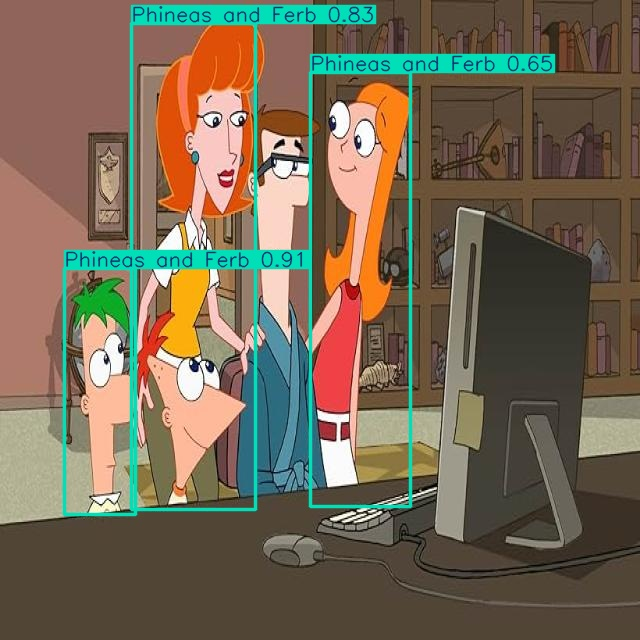

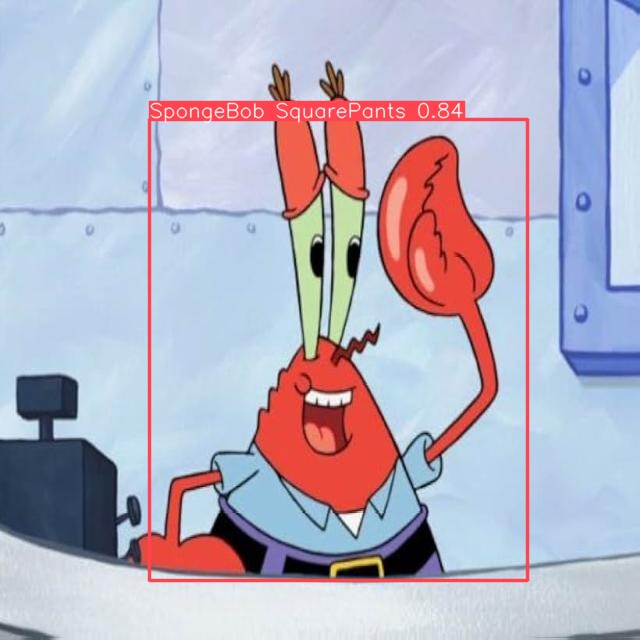

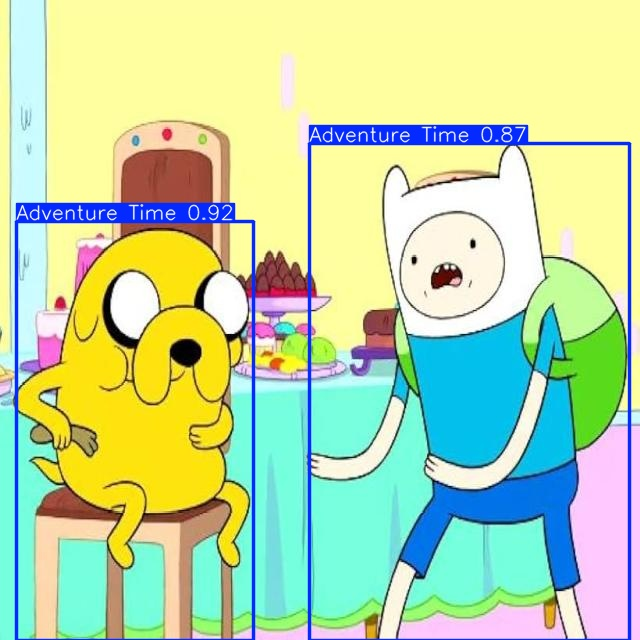

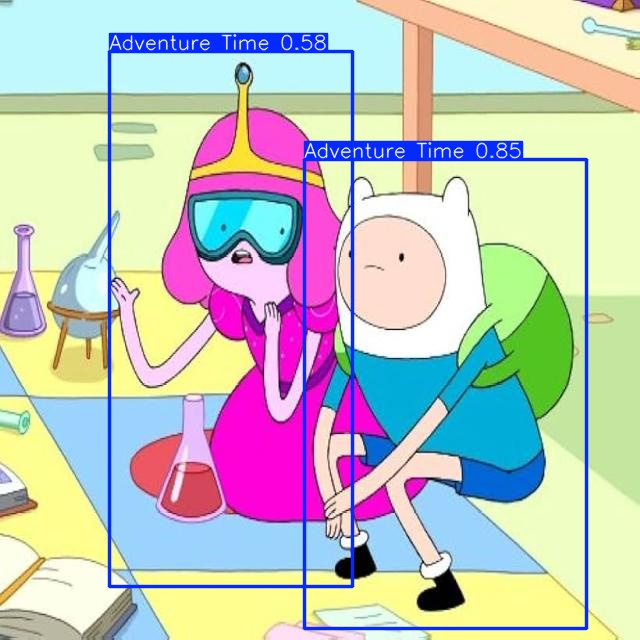

In [14]:
import glob
from IPython.display import Image, display

# Define the base path where the folders are located
base_path = '/content/runs/detect/'

# List all directories that start with 'predict' in the base path
subfolders = [os.path.join(base_path, d) for d in os.listdir(base_path)
              if os.path.isdir(os.path.join(base_path, d)) and d.startswith('predict')]

# Find the latest folder by modification time
latest_folder = max(subfolders, key=os.path.getmtime)

image_paths = glob.glob(f'{latest_folder}/*.jpg')[:5]

# Display each image
for image_path in image_paths:
    display(Image(filename=image_path, width=600))
    print("\n")